## Обучение

Пример запуска скрипта обучения модели

In [2]:
'''
!CUDA_VISIBLE_DEVICES=0 accelerate launch --mixed_precision "fp16" ./src/train_ip_adapter.py \
  --pretrained_model_name_or_path='stable-diffusion-v1-5/stable-diffusion-v1-5' \
  --image_encoder_path="~/IP-Adapter/models/image_encoder" \
  --data_csv_file="~/datasets/CelebAMask-HQ/new_celeba_captions.csv" \
  --data_root_path="~/datasets//CelebAMask-HQ/CelebA-HQ-img" \
  --mixed_precision="fp16" \
  --wandb_run_name="run_512" \
  --num_train_epochs=100 \
  --resolution=512 \
  --train_batch_size=64 \
  --dataloader_num_workers=4 \
  --learning_rate=1e-04 \
  --weight_decay=0.01 \
  --output_dir="~/Team73-Annual-Project/weights/512_res_model" \
  --save_steps=-1 \
  --save_epochs=10
'''

'\n!CUDA_VISIBLE_DEVICES=0 accelerate launch --mixed_precision "fp16" ./src/train_ip_adapter.py   --pretrained_model_name_or_path=\'stable-diffusion-v1-5/stable-diffusion-v1-5\'   --image_encoder_path="~/IP-Adapter/models/image_encoder"   --data_csv_file="~/datasets/CelebAMask-HQ/new_celeba_captions.csv"   --data_root_path="~/datasets//CelebAMask-HQ/CelebA-HQ-img"   --mixed_precision="fp16"   --wandb_run_name="run_512"   --num_train_epochs=100   --resolution=512   --train_batch_size=64   --dataloader_num_workers=4   --learning_rate=1e-04   --weight_decay=0.01   --output_dir="~/Team73-Annual-Project/weights/512_res_model"   --save_steps=-1   --save_epochs=10\n'

## Эксперименты

Логи экспериментов можно найти тут: [Wandb Workspace](https://wandb.ai/mishac22/IP-Adapter-HSE?nw=nwusermishac22)

## Пример использования

In [3]:
import torch
import torchvision.transforms as T
from diffusers import StableDiffusionPipeline, DDIMScheduler, AutoencoderKL, KandinskyV22PriorPipeline
from PIL import Image

from src.ip_adapter import IPAdapter

Добавляем пути к используемым моделям

- Чекпоинт для IP-адаптера (ip_ckpt):  [здесь](https://drive.google.com/file/d/1SA1cVESdbZEGFvqcPYHrzUV6lt5GGhJK/view?usp=sharing)
- Чекпоинт для image_encoder: [здесь](https://drive.google.com/file/d/1b2Oux8DoZFir5AuQ2FVKeMIfLl3XXLps/view?usp=sharing)

In [4]:
base_model_path = 'dreamlike-art/dreamlike-anime-1.0'
vae_model_path = "stabilityai/sd-vae-ft-mse"
image_encoder_path = "~/Team73-Annual-Project/models/image_encoder"
ip_ckpt = "~/Team73-Annual-Project/checkpoints/512_res_model/checkpoint-100/ip_adapter.bin"
device = "cuda:0"

In [5]:
# Полезная функция для удобного вывода картинок

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

Загружаем модели и пайплайн

In [6]:
noise_scheduler = DDIMScheduler(
    num_train_timesteps=1000,
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    clip_sample=False,
    set_alpha_to_one=False,
    steps_offset=1,
)
vae = AutoencoderKL.from_pretrained(vae_model_path).to(dtype=torch.float16)

In [7]:
pipe = StableDiffusionPipeline.from_pretrained(
    base_model_path,
    torch_dtype=torch.float16,
    scheduler=noise_scheduler,
    vae=vae,
    feature_extractor=None,
    safety_checker=None
)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [8]:
ip_model = IPAdapter(pipe, image_encoder_path, ip_ckpt, device)

Загружаем картинки-промпты

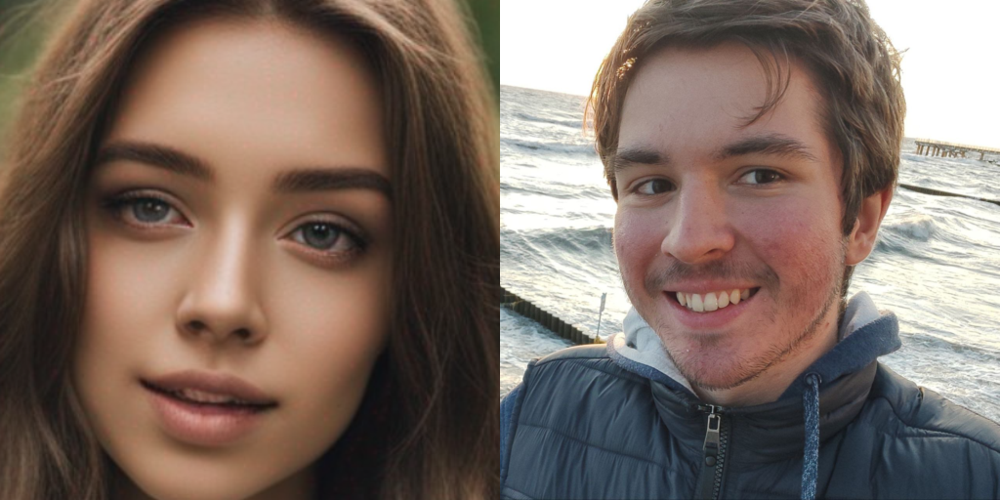

In [8]:
resize = T.Resize(512)

image = resize(Image.open("./assets/images/ai_face.png").convert('RGB'))
image2 = resize(Image.open("./assets/images/literally_me.jpg").convert('RGB'))

image_prompts = [image, image2]
image_grid(image_prompts, 1, 2)

Генерируем картинки.

- Параметр prompt позволяет добавить дополнительные условия генерации (локация, детали лица, и.т.п.)
- Параметр scale регулирует степень соответствия картинке-промпту

  0%|          | 0/50 [00:00<?, ?it/s]

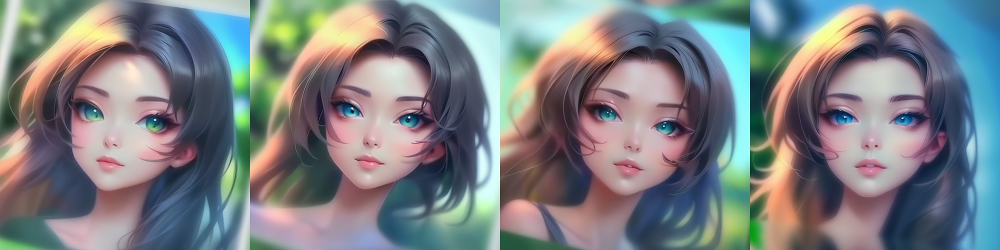

In [10]:
images = ip_model.generate(pil_image=image_prompts[0], prompt='hand-drawn anime style', num_samples=4, height=512, width=512, num_inference_steps=50, scale=0.7)
image_grid(images, 1, 4)

  0%|          | 0/50 [00:00<?, ?it/s]

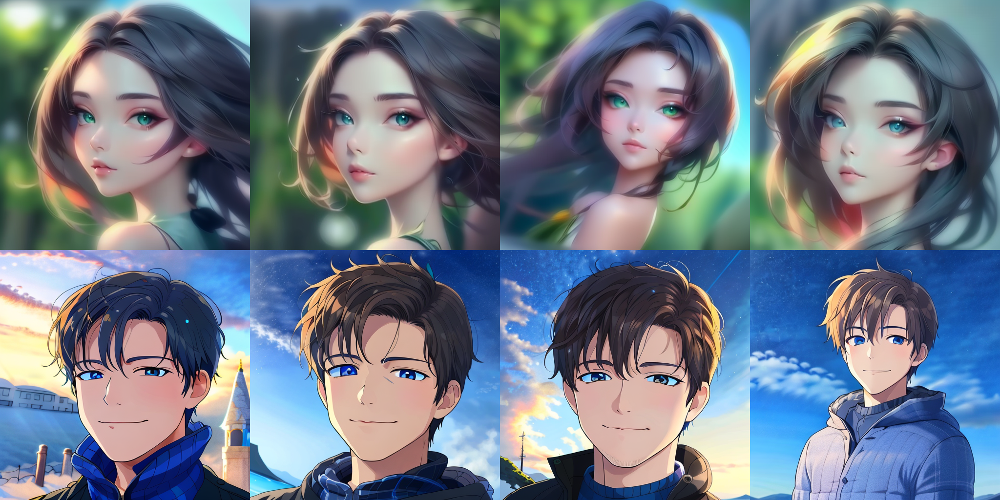

In [13]:
images = ip_model.generate(pil_image=image_prompts, prompt='anime style', num_samples=4, height=512, width=512, num_inference_steps=50, scale=0.8)
image_grid(images, 2, 4)

  0%|          | 0/50 [00:00<?, ?it/s]

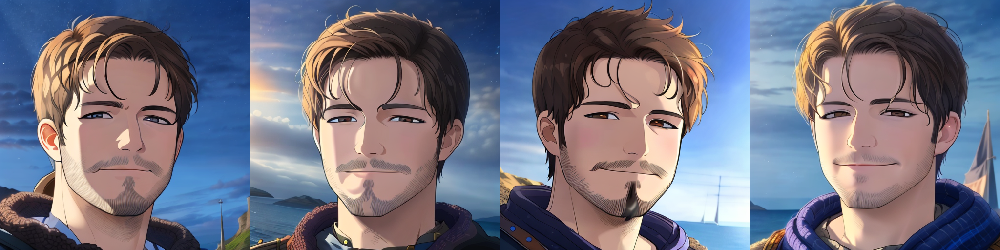

In [22]:
images = ip_model.generate(pil_image=image_prompts[1], prompt='viking, beard, brown eyes, anime style', num_samples=4, height=512, width=512, num_inference_steps=50, scale=0.8)
image_grid(images, 1, 4)

  0%|          | 0/50 [00:00<?, ?it/s]

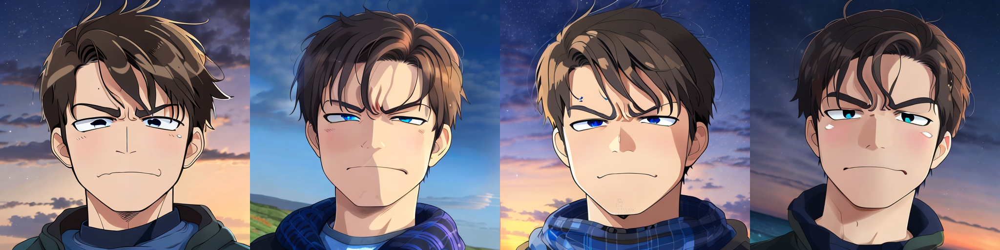

In [35]:
images = ip_model.generate(pil_image=image_prompts[1], prompt='angry face, anime style', num_samples=4, height=512, width=512, num_inference_steps=50, scale=0.8)
image_grid(images, 1, 4)

  0%|          | 0/50 [00:00<?, ?it/s]

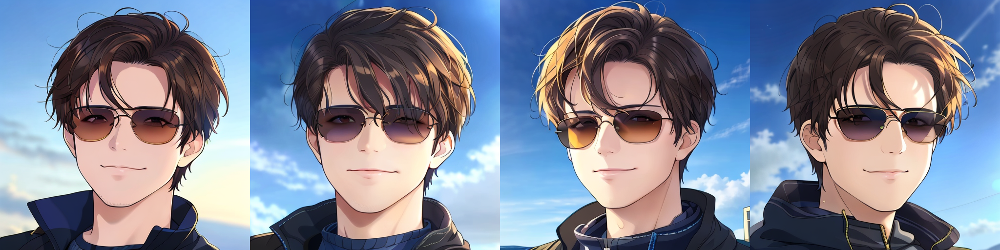

In [31]:
images = ip_model.generate(pil_image=image_prompts[1], prompt='sunglasses, brown eyes, anime style', num_samples=4, height=512, width=512, num_inference_steps=50, scale=0.7)
image_grid(images, 1, 4)

  0%|          | 0/50 [00:00<?, ?it/s]

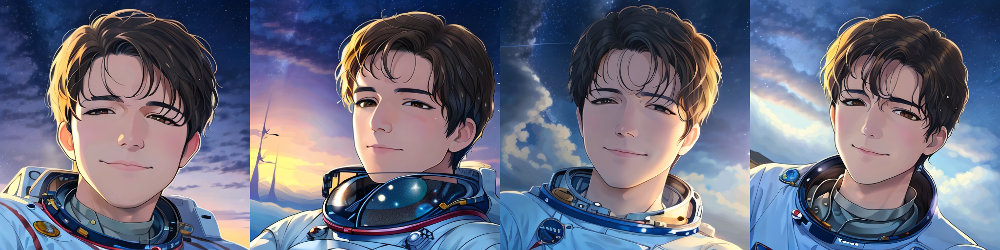

In [46]:
images = ip_model.generate(pil_image=image_prompts[1], prompt='Astronaut, brown eyes, anime style', num_samples=4, height=512, width=512, num_inference_steps=50, scale=0.8)
image_grid(images, 1, 4)